In [ ]:
#!git clone https://github.com/rwightman/efficientdet-pytorch.git
#!wget https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_d1-4c7ebaf2.pth
#!mv tf_efficientdet_d1-4c7ebaf2.pth tf_efficientdet_d1.pth

In [ ]:
#!pip install timm
#!pip install omegaconf
#!pip install tensorboard

In [2]:
%cd ..

/Users/washizakikai/dev/work/renofa/git/efficientdet-pytorch


### [apex](https://github.com/NVIDIA/apex)


In [ ]:
#!git clone https://github.com/NVIDIA/apex
#!cd apex
#!pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" ./

### config

In [8]:
import os
import sys
import time
import gc
import numpy as np
from datetime import datetime
import argparse
import torch
import torchvision.utils
from pycocotools.coco import COCO
from PIL import Image

sys.path.append(os.path.join('./efficientdet-pytorch'))
sys.path.append(os.path.join('./apex'))


try:
    from apex import amp
    has_amp = True
except ImportError:
    has_amp = False

#has_apex = False
print("Using apex:", has_amp)

from effdet import create_model, get_efficientdet_config, EfficientDet,DetBenchPredict, unwrap_bench
from effdet.efficientdet import HeadNet
from data import create_loader, CocoDetection, transforms_coco_eval
from timm.utils import *
import matplotlib.pyplot as plt
import cv2
from glob import glob

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

from data import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
mean = IMAGENET_DEFAULT_MEAN
std = IMAGENET_DEFAULT_STD
mean = torch.tensor([x * 255 for x in mean]).to(device).view(1, 3, 1, 1)
std = torch.tensor([x * 255 for x in std]).to(device).view(1, 3, 1, 1)

torch.backends.cudnn.benchmark = True

Using apex: False
Using device: cpu


In [9]:
# 設定
img_size = 640
BatchSize = 20
setup_default_logging()

## ローダーの設定

In [10]:
test_dir_path = "./test-data"
os.path.exists(test_dir_path)

True

In [14]:
test_img_paths = glob.glob(test_dir_path + "/*")
print(len(test_img_paths))


34


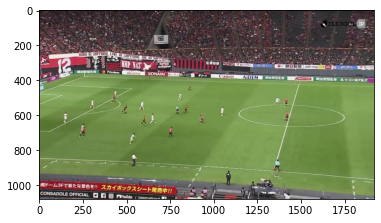

In [15]:
img = cv2.imread(test_img_paths[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


## モデルの設定

In [8]:
model_name = "tf_efficientdet_d1"
pretrained = True
prefetcher = True
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [9]:
!ls

annotations		      eval_cocoAno.json     predict_efdet.ipynb
annotations_trainval2017.zip  eval_create.ipynb     temp.json
apex			      eval_issia	    tf_efficientdet_d1.pth
cocoAno.json		      gpu		    train2017
dataset_create.ipynb	      issia		    train_cocoAno.json
ed_pytorch.ipynb	      learning_efdet.ipynb  train_issia
efficientdet-pytorch	      output		    val2017


In [75]:
# model load
num_gpu = 1
prefetcher = True # must true
model_name = "tf_efficientdet_d1"
class ArgPars():
    def __init__(self):
        self.model = model_name
args = ArgPars()

def load_net(checkpoint_path):
    config = get_efficientdet_config('tf_efficientdet_d1')
    net = EfficientDet(config, pretrained_backbone=False)

    config.num_classes = 2
    config.image_size=640
    net.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))

    checkpoint = torch.load(checkpoint_path)
    net.load_state_dict(checkpoint['state_dict'])

    del checkpoint
    gc.collect()

    net = DetBenchPredict(net, config)
    net.eval();
    return net.cuda()
checkpoint = "output/t1/train/20200924-100641-tf_efficientdet_d1/checkpoint-57.pth.tar"
checkpoint = "output/t1/train/20200924-100641-tf_efficientdet_d1/model_best.pth.tar"
model = load_net(checkpoint)
input_size = model.config.image_size
param_count = sum([m.numel() for m in model.parameters()])
print('Model %s created, param count: %d' % (model_name, param_count))

Model tf_efficientdet_d1 created, param count: 6555410


In [76]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
image_tf = transforms_coco_eval(img_size=input_size, use_prefetcher=prefetcher) #その他はデフォルト値, prefecherはtrue
ann = dict(img_id=0, img_size=(input_size, input_size))

In [77]:
if has_amp:
    print('Using AMP mixed precision.')
    model = amp.initialize(model, opt_level='O1')
else:
    print('AMP not installed, running network in FP32.')

Using AMP mixed precision.
Selected optimization level O1:  Insert automatic casts around Pytorch functions and Tensor methods.

Defaults for this optimization level are:
enabled                : True
opt_level              : O1
cast_model_type        : None
patch_torch_functions  : True
keep_batchnorm_fp32    : None
master_weights         : None
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O1
cast_model_type        : None
patch_torch_functions  : True
keep_batchnorm_fp32    : None
master_weights         : None
loss_scale             : dynamic


In [16]:
# 画像の前処理
# 画像の分割　実験なので 2分割 (　横2)と仮定 
# 256,512,640, 768, 1024, 1280, 1920
def img_preprocessing(img, size=768):
    """
    正方形に切り抜くこととする
    """
    base = 64
    h, w, c = img.shape
    #print(h, w, c)
    h_mag = h/(size - base)
    w_mag = w/(size - base)
    #print(h_mag, w_mag)
    h_cmag = math.ceil(h_mag)
    w_cmag = math.ceil(w_mag)
    
    rest_h, rest_w = h_cmag * size - h, w_cmag * size - w
    #print(rest_h, rest_w)
    
    imgs = []
    crop_points = []
    
    for hp in range(h_cmag):
        start_h = hp * (size - base)
        end_h = start_h + size
        if end_h >= h:
            end_h = h - 1
            start_h = end_h - size
        for wp in range(w_cmag):
            start_w = wp * (size - base)
            end_w = start_w + size
            if end_w >= w:
                end_w = w - 1
                start_w = end_w - size
            
            imgs.append(img[start_h:end_h, start_w:end_w])
            crop_points.append({"left":start_w, "top":start_h, "bottom":end_h, "right":end_w})

    return imgs, crop_points

# 出力結果のリスト
def kp_postprocessing(results, score, crop_points, origin_shape, minbbsize=3):
    # resultsとcrp_pointsの順番は、preprocessingに合わせたものとする
    #print(crop_points)
    pw = ph = 20 # < 128
    new_bboxes = []
    new_scores = []
    prev_top = 0
    prev_bottom = 0
    prev_left = 0
    prev_right = 0
    #print(crop_points)
    for (res, sc, cp) in zip(results, score, crop_points):
        
        
        if prev_top != cp["top"]:
            # 新しい高さの切り出しの処理への遷移
            prev_left = 0
            prev_right = 0
            prev_top = cp["top"] # 更新されないように修正
            prev_bottom = cb
            
        cl, ct, cb, cr = cp["left"], cp["top"], cp["bottom"], cp["right"]
        
        
        div_l = prev_right - pw
        div_r = cr - pw
        div_t = prev_bottom - ph
        div_b = cb - ph
        #print(div_l, div_t, div_r, div_b, cp)
        
        for b, s in zip(res, sc):
            # bbox に対する処理
            ## input: [[l, t, w, h],...]
            
            bl = b[0] + cl
            bt = b[1] + ct
            br = b[0] + b[2] + cl
            bb = b[1] + b[3] + ct
            
            # 以下の条件でbboxをスキップ
            if (br < div_l or bl > div_r) or (bb < div_t or bt > div_b) or (b[2] <= minbbsize or b[3] <= minbbsize):
                continue
            
            new_bboxes.append([bl, bt, br, bb]) 
            new_scores.append(s)
        
        # next
        prev_left = cl
        prev_right = cr
        
    return new_bboxes, new_scores

def convert_eval_format(bbox_list):
    """
    cv_list = []
    for bbox in bbox_list:
        
        cv_list.append({
            'width': int(bbox[2] - bbox[0]), 'top': int(bbox[1]), 'height': int(bbox[3] - bbox[1]), 'left': int(bbox[0])
        })
        
        
    return cv_list
    """
    # Left, Top, Right, Bottom
    return bbox_list

def predict_formater_for_plot(bbox, label, score, ball=True, person=True, ball_top = True, ball_id=37, person_id=1, score_threth=0.5):
  _ball_bbox, _person_bbox, _ball_score, _person_score = [None for _ in range(4)]

  if ball:
    if ball_top:
      #一番スコアが高いものをselect
      inds = np.where((label == ball_id) & (score >= score_threth))
      if inds[0].shape[0] != 0:
        ind = np.argmax(score[inds[0]])
        _ball_bbox = np.array([bbox[ind]])
        _ball_score = np.array([score[ind]])
    else:
      _ball_bbox = bbox[(label == ball_id) & (score >= score_threth)]
      _ball_score = score[(label == ball_id) & (score >= score_threth)]
  if person:
    _person_bbox = bbox[(label == person_id) & (score >= score_threth)]
    _person_score = score[(label == person_id) & (score >= score_threth)]
  
  return _ball_bbox, _person_bbox, _ball_score, _person_score

In [79]:
model.eval()
show_id= 1
ndexes = []
eval_dict = {}
count = 0
with torch.no_grad():
    for idx, img_path in tqdm(enumerate(test_img_paths)):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imgs, crop_p= img_preprocessing(img, size=input_size)

        b_list, p_list = [], []
        bs_list, ps_list = [], []

        iter_num = 1
        for iter_id in range(iter_num):
            #print("iter", iter_id)
            input_imgs = []
            imgs_scale = []
            imgs_size = []
            for c_img in imgs[iter_id * batch_size:(iter_id + 1) *batch_size]:
                c_img=Image.fromarray(c_img)
                tf_img, tf_ann = image_tf(c_img, ann)
                input_imgs.append(tf_img)
                imgs_scale.append(tf_ann['img_scale'])
                imgs_size.append([input_size, input_size])
            input_imgs = np.array(input_imgs)
            input_imgs = torch.from_numpy(input_imgs).to(device)
            input_imgs = input_imgs.float().sub_(mean).div_(std)

            imgs_scale = np.array(imgs_scale)
            imgs_scale = torch.from_numpy(imgs_scale).to(device, dtype=torch.float32)

            imgs_size = np.array(imgs_size)
            imgs_size = torch.from_numpy(imgs_size).to(device, dtype=torch.int32)


            predict = bench(input_imgs, imgs_scale, imgs_size)
            predict = predict.cpu()
            del input_imgs
            del imgs_scale
            del imgs_size
            # 2, 100, 6
            for p in predict:  
                bboxes = []
                labels = []
                scores = []
                for det in p:
                    scores.append(float(det[4]))
                    labels.append(int(det[5]))
                    bboxes.append(det[0:4].tolist())

                scores = np.array(scores)
                labels = np.array(labels)
                bboxes = np.array(bboxes)

                ball_bbox, _, ball_score, _ = predict_formater_for_plot(bboxes, labels, scores, person_id=1, ball_id=2, person=False, ball_top = False, score_threth=PREDICT_THRETH)
                

                b_list.append(ball_bbox)
#                 p_list.append(person_bbox)

                bs_list.append(ball_score)
#                 ps_list.append(person_score)
        # bl, bu, br ,bb
        ball_bbox, ball_scores = kp_postprocessing(b_list, bs_list,  crop_p ,origin_shape=(height, width, channel))   
#         person_bbox, person_scores = kp_postprocessing(p_list, ps_list, crop_p ,origin_shape=(height, width, channel))

        eval_dict[idx] = {}
        eval_dict[idx]['od_ball_bbox'] = convert_eval_format(ball_bbox)
#         eval_dict[idx]['od_person_bbox'] = convert_eval_format(person_bbox)
        eval_dict[idx]['od_ball_score'] = ball_scores
#         eval_dict[idx]['od_person_score'] = person_scores

tensor([[[1.4053e+02, 5.7963e+01, 1.2297e+02, 3.5341e+02, 1.2891e-01,
          1.0000e+00],
         [9.9468e+00, 7.9062e+01, 1.4218e+02, 3.4355e+02, 8.8806e-02,
          1.0000e+00],
         [2.8911e+02, 1.3180e+02, 5.5204e+00, 5.5270e+00, 6.6956e-02,
          2.0000e+00],
         ...,
         [6.4000e+02, 5.3826e+02, 0.0000e+00, 9.3811e+00, 1.4389e-02,
          2.0000e+00],
         [3.5529e+01, 1.0939e+02, 2.2560e+02, 4.2239e+02, 1.4389e-02,
          1.0000e+00],
         [6.4000e+02, 4.6266e+01, 0.0000e+00, 8.0496e+00, 1.4282e-02,
          2.0000e+00]],

        [[5.9326e+02, 2.7516e+02, 5.7980e+00, 5.8536e+00, 5.8136e-02,
          2.0000e+00],
         [6.4000e+02, 9.2075e+01, 0.0000e+00, 2.0287e+01, 4.2725e-02,
          2.0000e+00],
         [6.4000e+02, 5.8933e+01, 0.0000e+00, 1.3973e+01, 3.7262e-02,
          2.0000e+00],
         ...,
         [6.4000e+02, 3.6014e+02, 0.0000e+00, 1.4020e+01, 1.5778e-02,
          2.0000e+00],
         [6.4000e+02, 0.0000e+00, 0.0000

## スケジューラ

torch.Size([20, 100, 6])


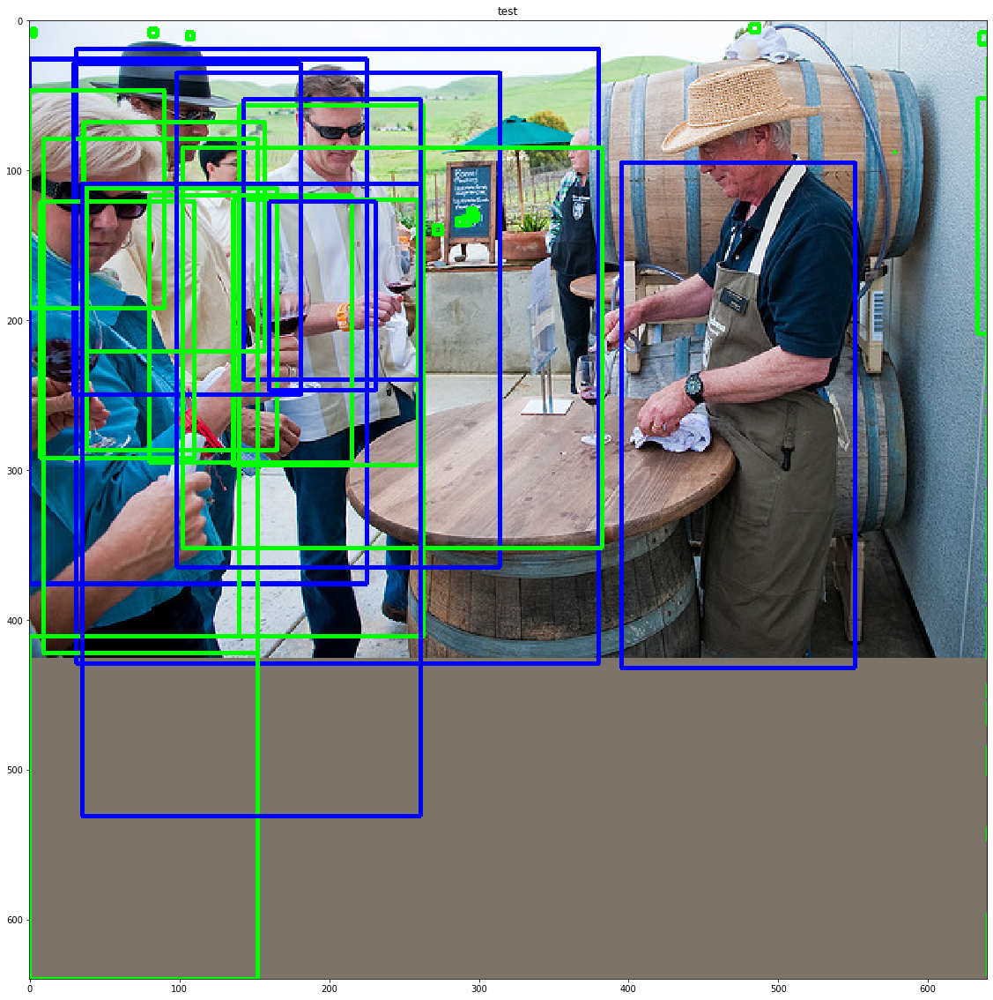

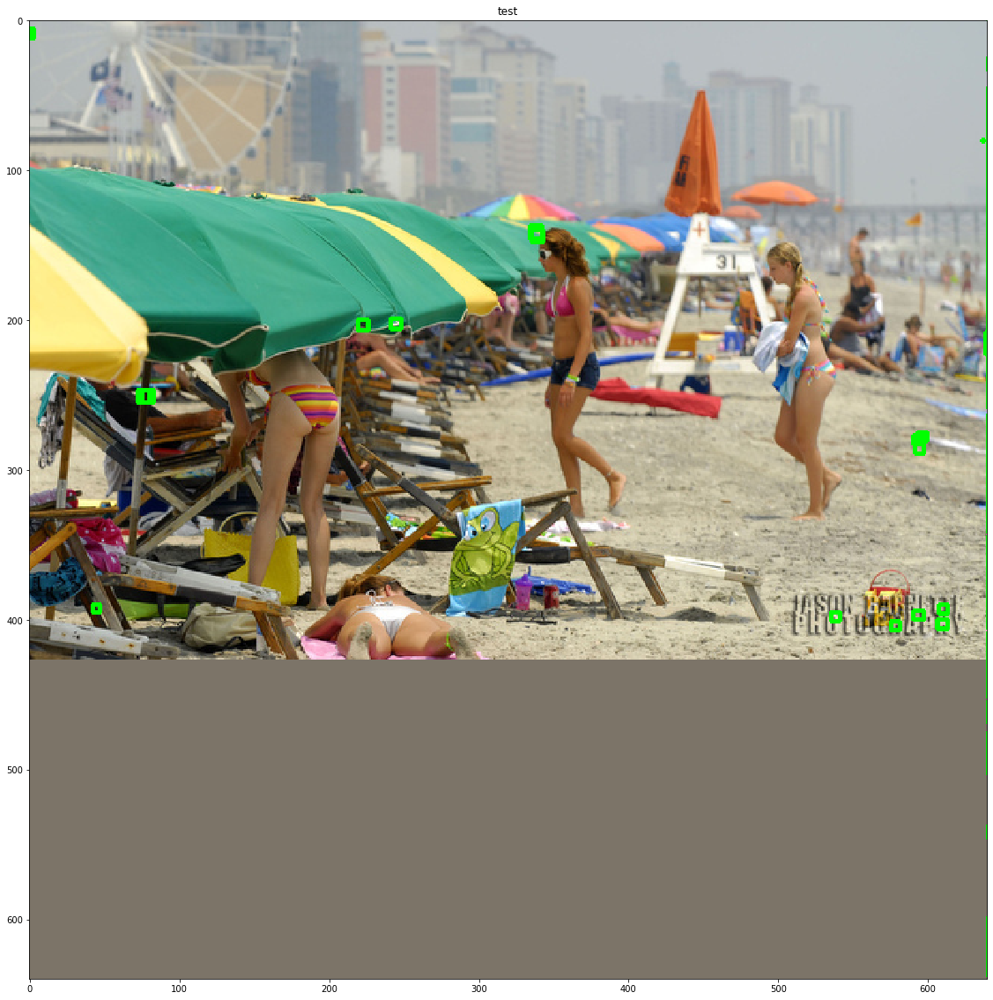

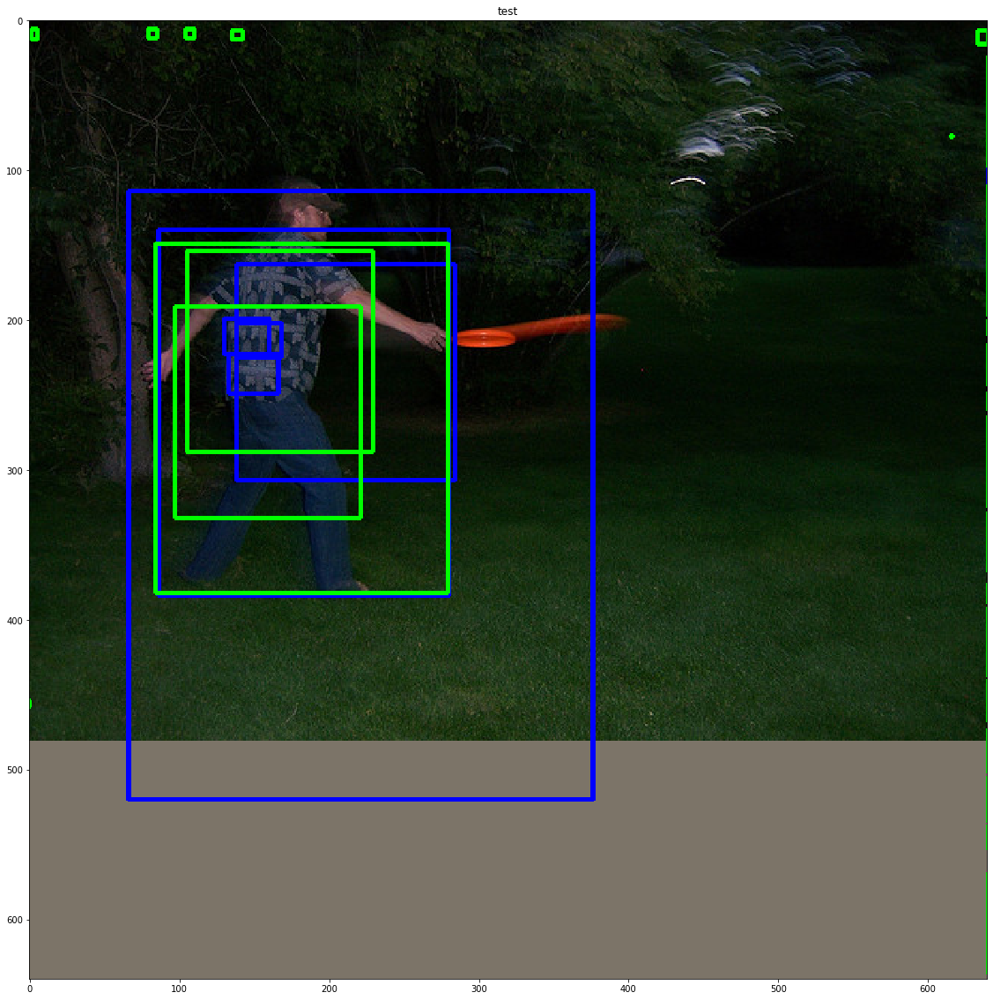

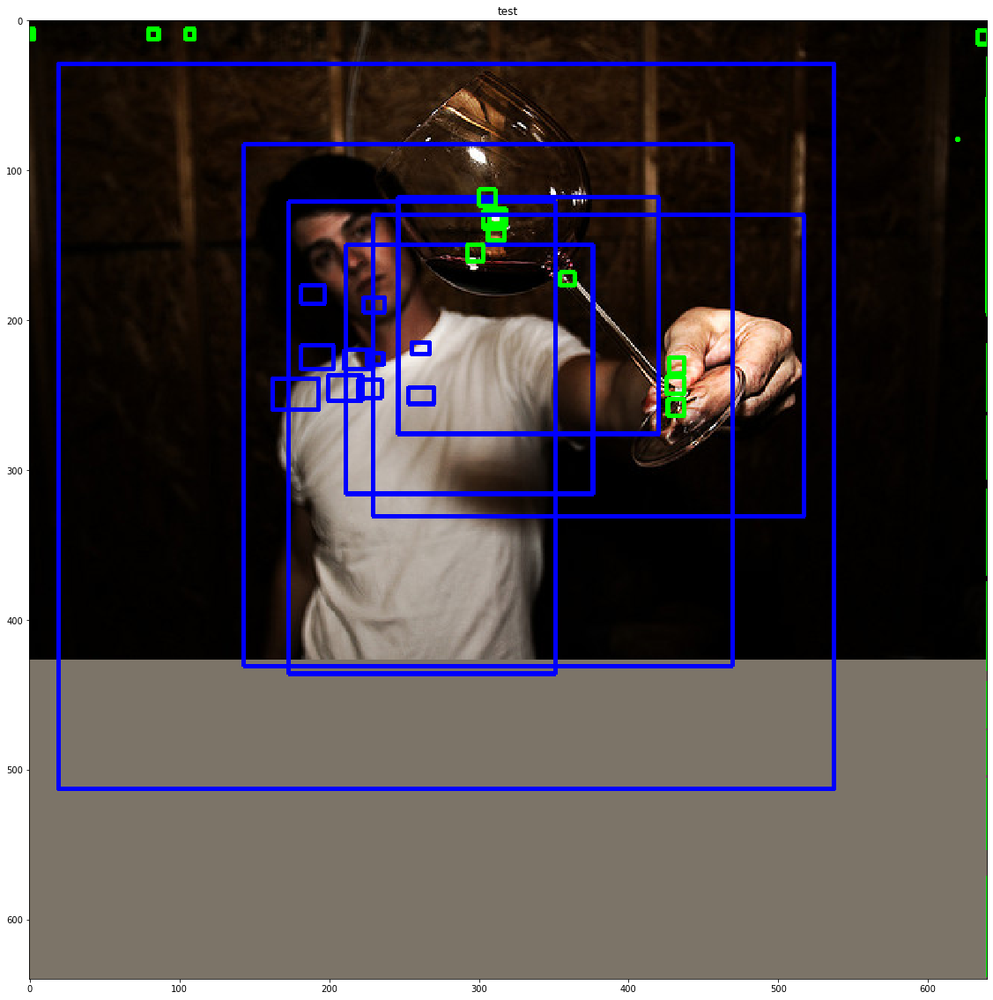

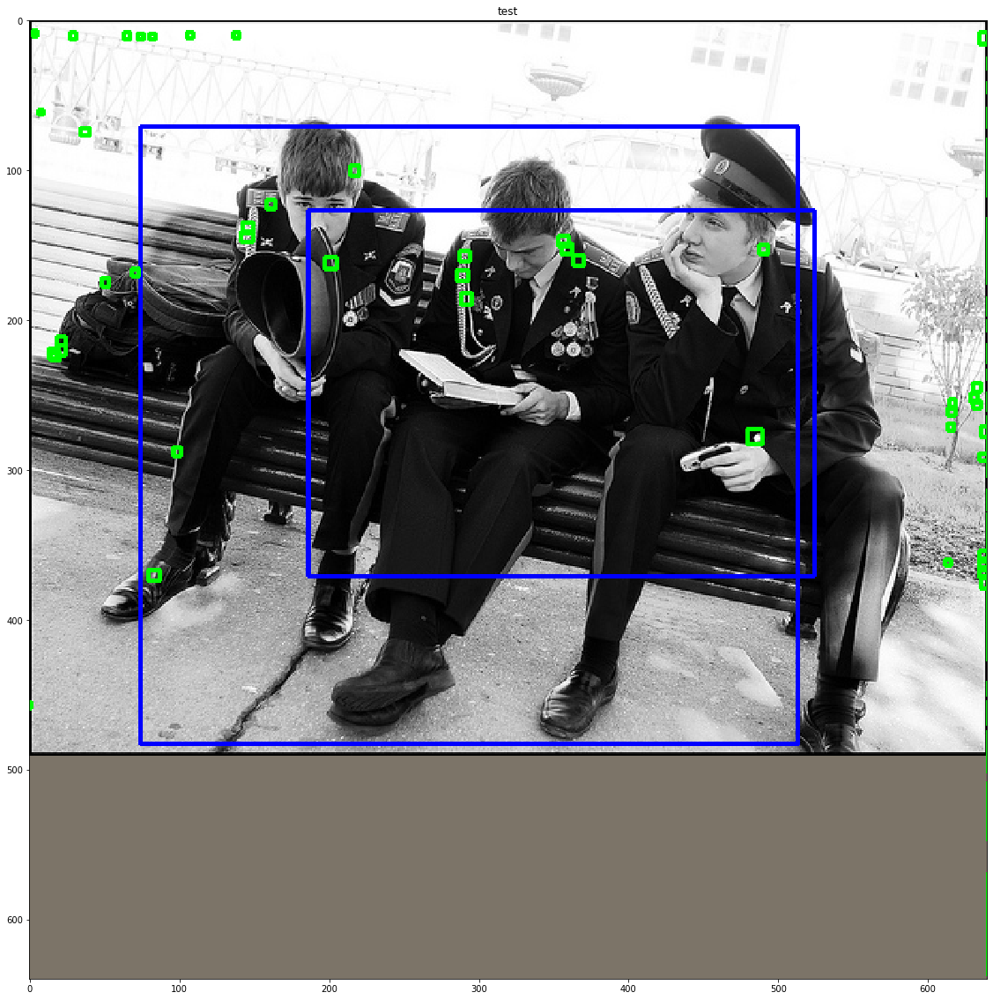

...

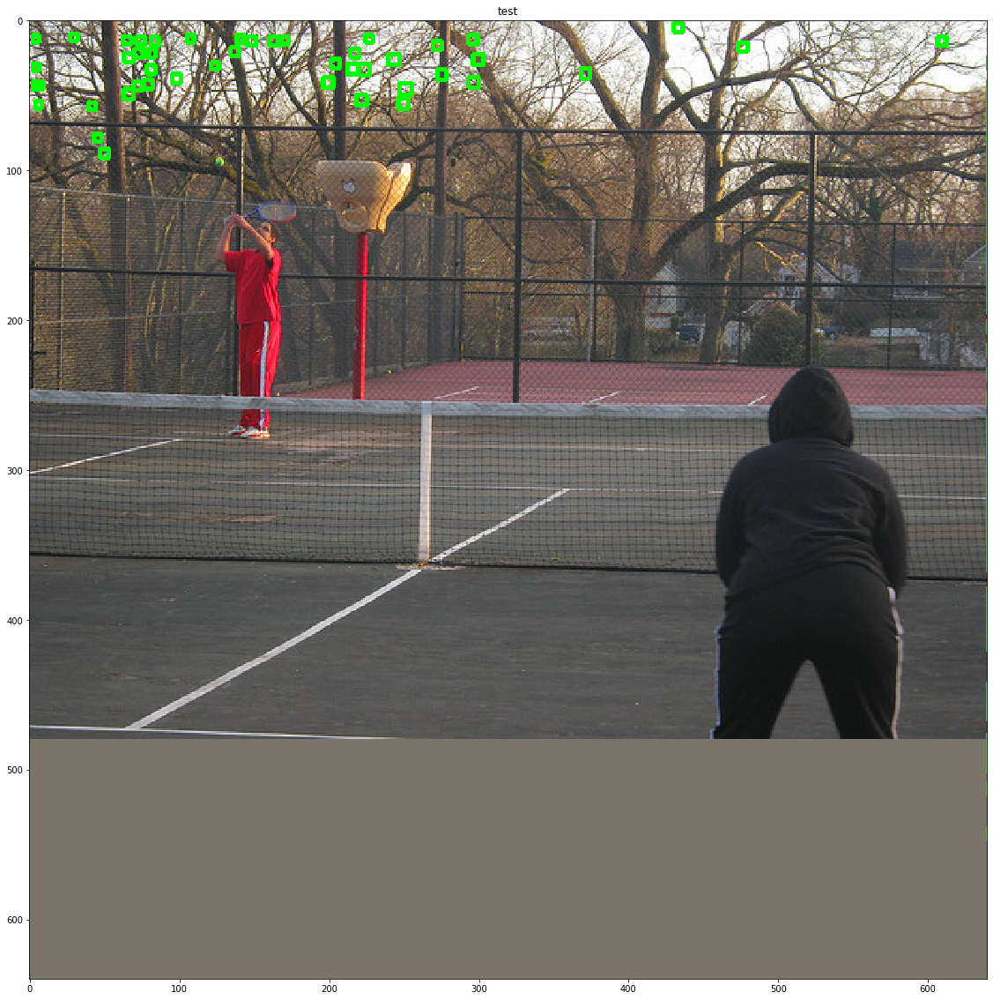

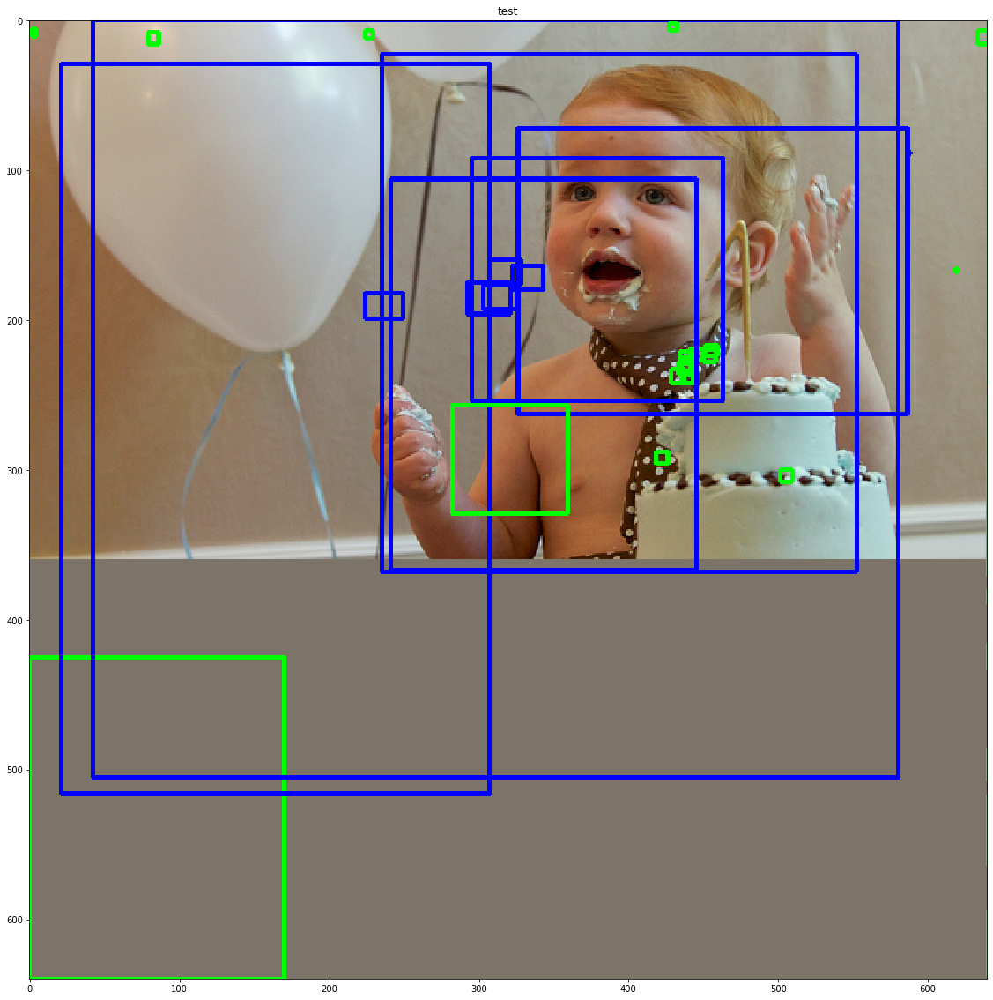

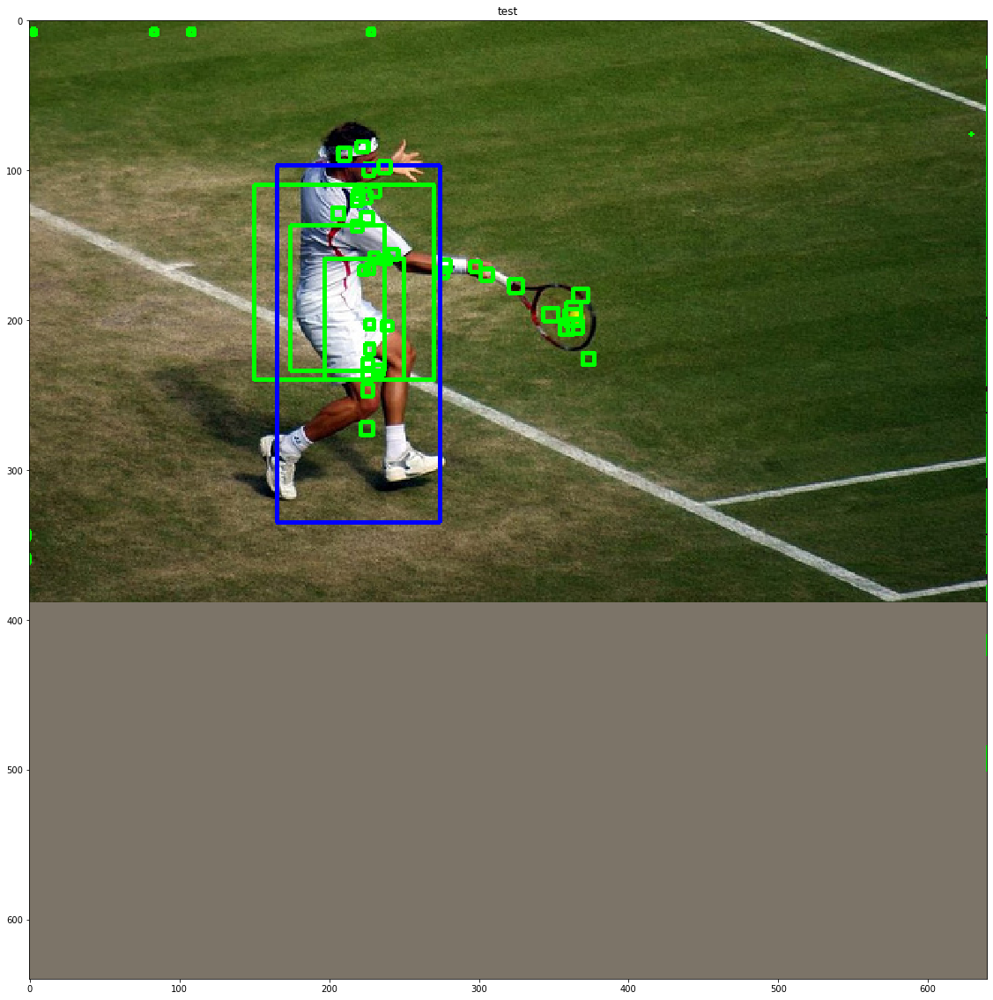

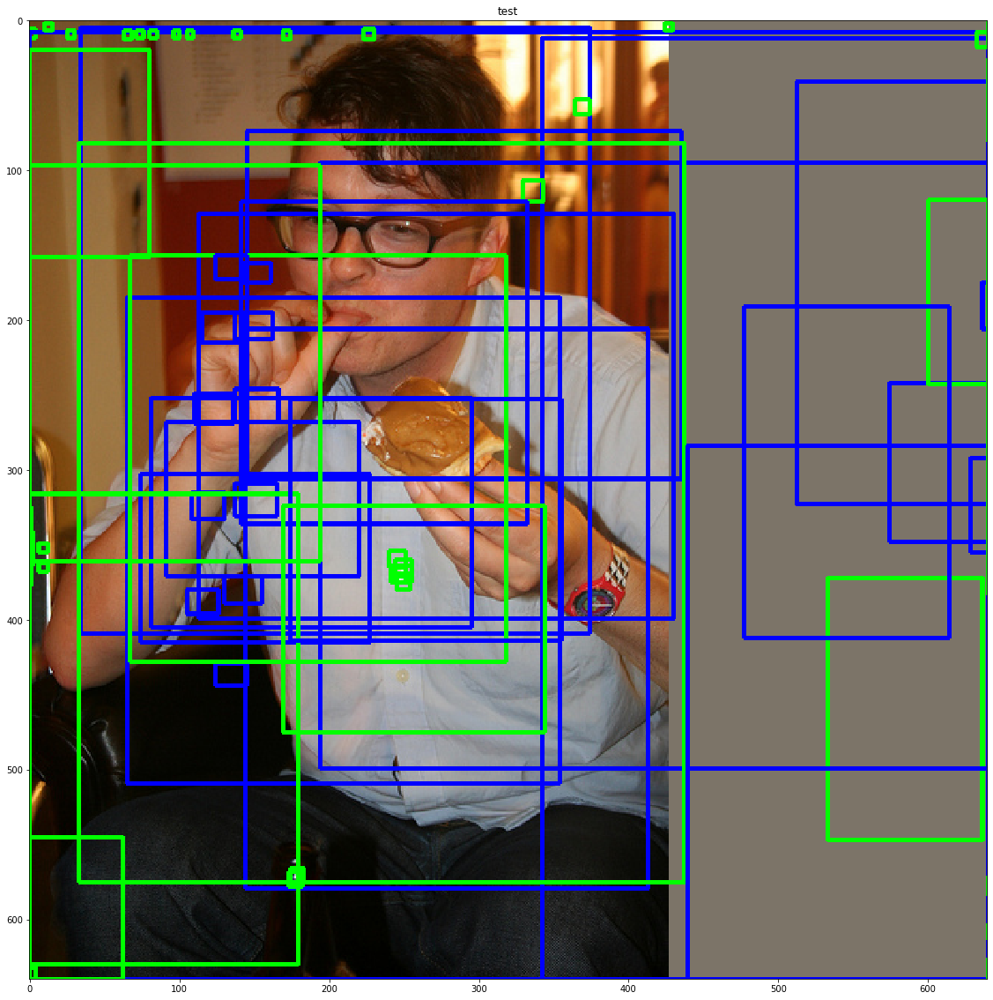

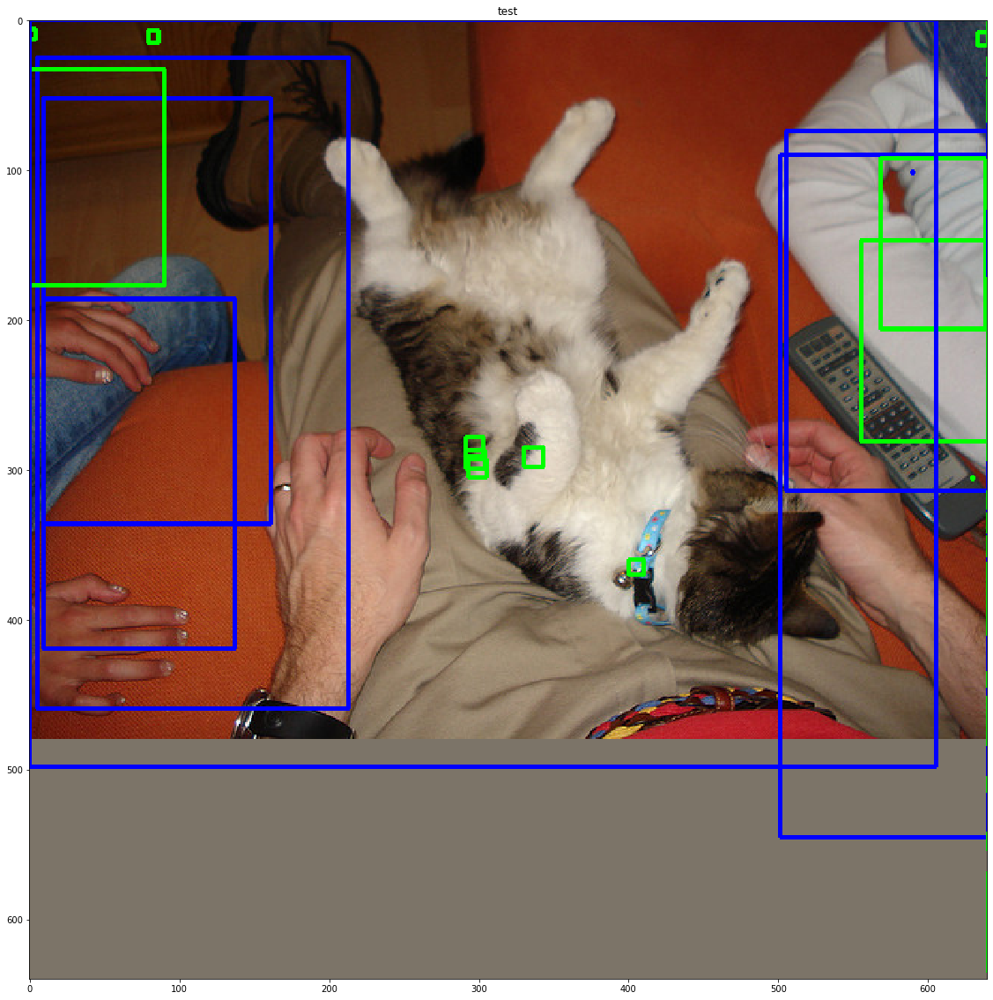

In [81]:
score_th = 0.1
for idx, img_path in tqdm(enumerate(test_img_paths)):
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bboxes =  eval_dict[idx]['od_ball_bbox']
    scores = eval_dict[idx]['od_ball_score']
    for det, score in zip(bboxes, scores):
        if score > score_th:
            img = cv2.rectangle(img, (int(det[0]), int(det[1])), (int(det[2]), int(det[3])), (0, 0, 255), thickness=2)
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.show()

# train

In [ ]:
print(1)